In [1]:
import sys, os
import json, pickle
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import time as pytime
import statsmodels.tsa.stattools as tsa
import ruptures as rpt
sys.path.append('../..')
import InsanallyLabEphysTools as ilep
from scipy.stats import gaussian_kde, sem, ttest_ind, ttest_rel, norm, mannwhitneyu, linregress, wilcoxon
from tqdm import tqdm
from types import SimpleNamespace
from sklearn import linear_model
from sklearn.model_selection import KFold
import seaborn as sns
import traceback
from itertools import product
from brokenaxes import brokenaxes
import pingouin as pg

plt.rcParams['legend.fontsize'] = 'small'
plt.rcParams['axes.labelsize'] = 'medium'
plt.rcParams['axes.formatter.limits'] = [-2,3]
plt.rcParams['axes.formatter.use_mathtext'] = True
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['figure.dpi'] = '150'

#Set global font parameters
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
#Set font type to TrueType for compatibility
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

TARGET_COLOR = '#ff3654'
NONTARGET_COLOR = '#5776ff'

CR_COLOR = '#808080'
NCR_COLOR = '#FF767C'
CNO_COLOR = '#00BFFF'
SWITCH_COLOR = '#B07A3B'
LASER_COLOR = '#3375E9'
GOOD_GREY = '#969696'
GOOD_GREEN = '#32A852'
NCR_CR_cmap = mpl.colors.LinearSegmentedColormap.from_list('NCR-CR color map', [NCR_COLOR, CR_COLOR], N=1000)
PHASE_COLORS = ['#c8abc9','#C27AC5','#764979','#B9D3F7','#5181C2','#3C557A']#V3

animal = 'AE_302'

ops_directory = 'D:\\OpsinTest_Cache'
beh_directory = 'Z:\\Behavioor'


stdfont = 14
stdyfrac = 0.06

C:\Users\insan\anaconda3\envs\Ephyanalysis\lib\site-packages\outdated\utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.3, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


In [2]:
EnumM2Session = []
EnumM2Clust = []

sessions = os.listdir(ops_directory)



for session in tqdm(sessions):
    sessionfile = ilep.loadSessionCached(ops_directory,session)
    if sessionfile.meta.animal == animal:
        
        EnumM2Session.append(session)

100%|██████████| 11/11 [00:00<00:00, 42.14it/s]


In [3]:
EnumM2Session

['AE_302_1_passive_M2.pickle',
 'AE_302_2_passive_M2.pickle',
 'AE_302_3_passive_M2.pickle']

In [4]:
sessionfile0 = ilep.loadSessionCached(ops_directory,EnumM2Session[0])
sessionfile1 = ilep.loadSessionCached(ops_directory,EnumM2Session[1])
sessionfile2 = ilep.loadSessionCached(ops_directory,EnumM2Session[2])

sessfionfile0_labels = sessionfile0.clusters.labels
sessionfile0_goodcells = [num for num, label in sessfionfile0_labels.items() if label == 'good']
sessionfile0_goodcells = np.array(sessionfile0_goodcells)

sessfionfile1_labels = sessionfile1.clusters.labels
sessionfile1_goodcells = [num for num, label in sessfionfile1_labels.items() if label == 'good']
sessionfile1_goodcells = np.array(sessionfile1_goodcells)

sessfionfile2_labels = sessionfile2.clusters.labels
sessionfile2_goodcells = [num for num, label in sessfionfile2_labels.items() if label == 'good']
sessionfile2_goodcells = np.array(sessionfile2_goodcells)

In [5]:
S0_laser = sessionfile0.trials.laser_events[0]
S1_laser = sessionfile1.trials.laser_events[0]
S2_laser = sessionfile2.trials.laser_events[0]

In [6]:
S0_laseron = [laser_event for index, laser_event in enumerate(S0_laser) if index % 2 == 0] 
S1_laseron = [laser_event for index, laser_event in enumerate(S1_laser) if index % 2 == 0] 
S2_laseron = [laser_event for index, laser_event in enumerate(S2_laser) if index % 2 == 0]

In [7]:
len(S0_laser)

800

In [8]:
S1_laser[1] - S1_laser[0] #0.1s laser on

2996

In [9]:
len(sessionfile0_goodcells)

58

In [10]:
len(sessionfile1_goodcells)

84

In [11]:
len(sessionfile2_goodcells)

86

In [12]:
sessionfile2.clusters

namespace(list=array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
                       14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
                       27,  28,  31,  32,  34,  36,  37,  38,  39,  40,  41,  42,  43,
                       44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,
                       57,  59,  60,  61,  62,  63,  64,  67,  68,  69,  70,  72,  73,
                       74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,
                       87,  88,  89,  90,  91,  92,  94,  95,  96,  97,  98,  99, 100,
                      101, 102, 103, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114,
                      115, 116, 117, 118, 119, 121, 122, 123, 124, 125, 126, 127, 128,
                      129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 141, 142,
                      143, 144, 145, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
                      157, 158, 159, 160, 1

In [13]:
sessionfile0_goodcells

array([  4,   9,  10,  11,  12,  15,  28,  33,  45,  46,  50,  52,  57,
        63,  65,  71,  72,  79,  87,  93,  94, 105, 109, 117, 121, 124,
       140, 153, 157, 158, 167, 175, 177, 185, 189, 192, 198, 199, 200,
       210, 214, 219, 227, 236, 241, 244, 247, 260, 265, 269, 275, 276,
       281, 285, 286, 287, 288, 289], dtype=int64)

In [14]:
sessionfile1_goodcells

array([  1,   6,   7,  13,  22,  50,  56,  61,  63,  64,  65,  74,  77,
        80,  81,  88,  95,  98, 101, 104, 105, 107, 117, 118, 119, 122,
       123, 125, 126, 134, 140, 141, 146, 147, 150, 170, 171, 173, 183,
       184, 195, 199, 200, 209, 212, 224, 225, 229, 230, 232, 237, 246,
       247, 251, 259, 265, 271, 272, 276, 277, 279, 283, 291, 303, 309,
       312, 314, 323, 324, 328, 339, 357, 358, 359, 361, 364, 365, 369,
       370, 374, 375, 377, 378, 381], dtype=int64)

In [15]:
sessionfile2_goodcells

array([  0,   1,   2,   3,   4,   6,   8,   9,  10,  14,  15,  19,  28,
        32,  37,  40,  41,  43,  44,  45,  46,  48,  53,  68,  70,  76,
        78,  82,  83,  84,  87,  90,  98, 100, 101, 103, 108, 109, 110,
       111, 112, 114, 115, 116, 119, 124, 130, 134, 138, 139, 141, 144,
       145, 155, 166, 168, 169, 170, 176, 177, 179, 186, 193, 195, 196,
       198, 202, 204, 205, 208, 209, 217, 220, 225, 227, 229, 231, 235,
       236, 243, 246, 247, 249, 252, 253, 258], dtype=int64)

In [17]:
def visualizeClusterInternal3(sessionfile,clust, laser_on):
    bw_scott_factor = 3
    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)

    color_to_use = 'black'

    #########################

    laserstart_times = laser_on
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    for laserstart_time in laserstart_times:

        #Need to get spike times for each laser trail...
        starttime = laserstart_time- 0.3*30000 #0.25
        endtime = laserstart_time + 0.55*30000 #0.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes= this_trial_spikes.astype(int)
        this_trial_spikes = this_trial_spikes -laserstart_time

        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs 
        
        if len(this_trial_spikes) != 0:
            trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')

    #Plot Raster
    for idx,trial in enumerate(trialSpikes):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialSpikes)), 0, 100, alpha=0.3, color=LASER_COLOR, lw=0,) #shading laser
    
    # for idx,trial in enumerate(laserstart_times):
    #     ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    # ax1.fill_betweenx(range(len(laserstart_times)), 0, 100, alpha=0.3, color=LASER_COLOR, lw=0,) #shading laser
    
    #Plot PSTH
    starttime = -250-50
    endtime = 500+50
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1000) #1000
    numSplits = min(10,len(trialSpikes))
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)

    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)

    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color=LASER_COLOR,lw=2,linestyle='-') #zorder = 10 line of tone

    ax2.set_xlim([-250,500])
    ax2.set_xticks([-250,0,250,500])
    ax2.set_xticklabels(['-250','0','250','500'],size=12)
    ax2.set_xlabel('Time (ms)',size=12)
    ax2.text(550,limit,'depth = '+str(sessionfile2.clusters.depth[clust]))

    #fig.close()
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Opsin verification\\S0'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Opsin verification\\S2'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches ='tight')
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Opsin verification\\tightS0'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Opsin verification\\tightS2'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches ='tight')
    return fig,[ax1,ax2]
    

In [18]:
# S0 clust 50

(<Figure size 600x900 with 2 Axes>,
 [<AxesSubplot:>,
  <AxesSubplot:xlabel='Time (ms)', ylabel='Firing rate (spikes/s)'>])

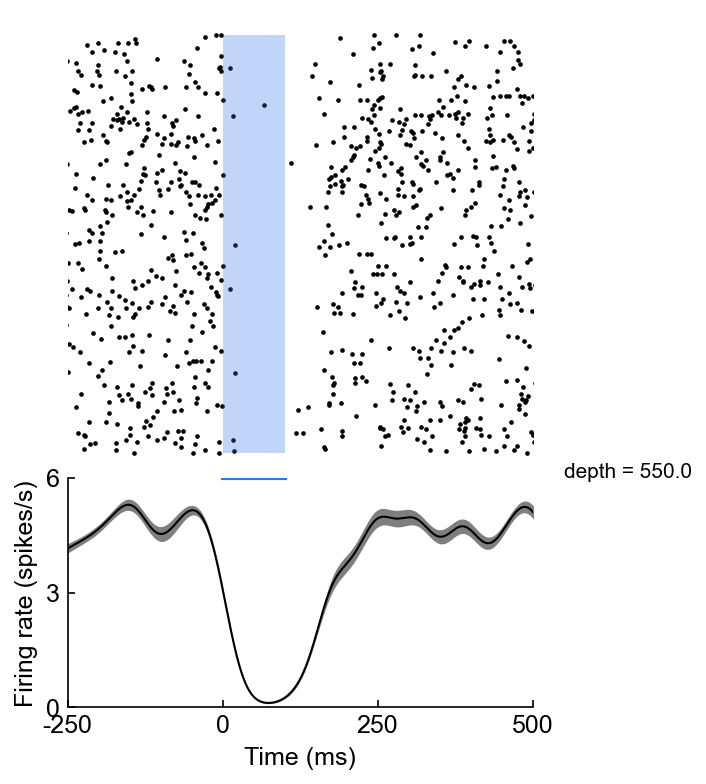

In [19]:
visualizeClusterInternal3(sessionfile0,50, S0_laseron)

In [93]:
def visualizeClusterInternal3(sessionfile,clust, laser_on):
    bw_scott_factor = 3
    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)

    color_to_use = 'black'

    #########################

    laserstart_times = laser_on
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    for laserstart_time in laserstart_times:

        #Need to get spike times for each laser trail...
        starttime = laserstart_time- 0.3*30000 #0.25
        endtime = laserstart_time + 0.55*30000 #0.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes= this_trial_spikes.astype(int)
        this_trial_spikes = this_trial_spikes -laserstart_time

        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs 
        
        if len(this_trial_spikes) != 0:
            trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')
    print(len(trialSpikes))
    trialSpikes = trialSpikes[:-35]
    #Plot Raster
    for idx,trial in enumerate(trialSpikes):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialSpikes)), 0, 100, alpha=0.3, color=LASER_COLOR, lw=0,) #shading laser
    
    # for idx,trial in enumerate(laserstart_times):
    #     ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    # ax1.fill_betweenx(range(len(laserstart_times)), 0, 100, alpha=0.3, color=LASER_COLOR, lw=0,) #shading laser
    
    #Plot PSTH
    starttime = -250-50
    endtime = 500+50
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1000) #1000
    numSplits = min(10,len(trialSpikes))
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)

    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)

    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit =24
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)],size=12)
    
    
    ax2.set_ylabel('Firing rate (spikes/s)',size=12)

    ax2.plot([0,100],[limit,limit],color=LASER_COLOR,lw=2,linestyle='-') #zorder = 10 line of tone

    ax2.set_xlim([-250,500])
    ax2.set_xticks([-250,0,250,500])
    ax2.set_xticklabels(['-250','0','250','500'],size=12)
    ax2.set_xlabel('Time (ms)',size=12)
    #ax2.text(550,limit,'depth = '+str(sessionfile2.clusters.depth[clust]))

    #fig.close()
    fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\Opsin verification\\S2'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches ='tight')
    return fig,[ax1,ax2]
    

In [94]:
# S2 clust 114

245


meta NOT subset; don't know how to subset; dropped


(<Figure size 600x900 with 2 Axes>,
 [<AxesSubplot:>,
  <AxesSubplot:xlabel='Time (ms)', ylabel='Firing rate (spikes/s)'>])

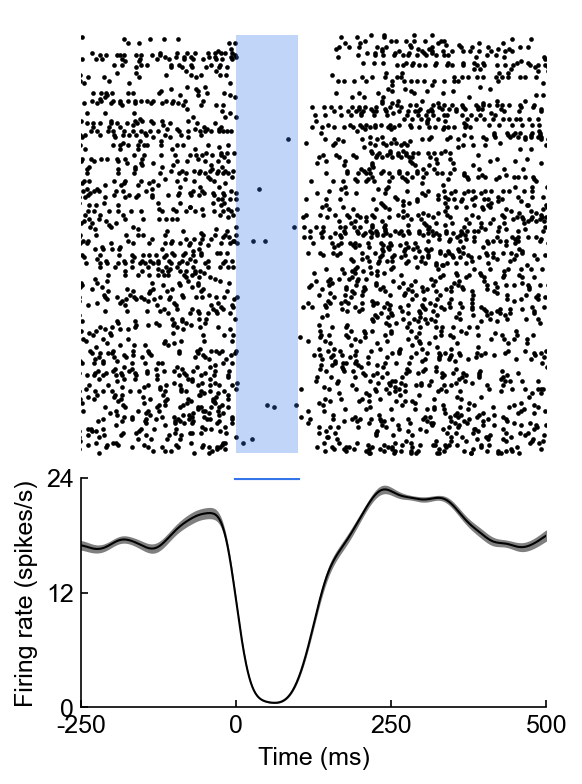

In [95]:
visualizeClusterInternal3(sessionfile2,114, S2_laseron)

# final

In [59]:
def visualizeClusterInternal3(sessionfile,clust, laser_on):
    bw_scott_factor = 3
    
    fig = plt.figure(figsize=(4,6))
    gs = fig.add_gridspec(2,1,height_ratios=[2,1],hspace=0.0125)
    ax1 = plt.subplot(gs[0,0])#Raster
    ax2 = plt.subplot(gs[1,0],sharex=ax1)#PSTH
    ax1.spines['bottom'].set_visible(False)
    ax1.spines['left'].set_visible(False)
    ax1.get_xaxis().set_visible(False)
    ax1.get_yaxis().set_visible(False)

    color_to_use = 'black'

    #########################

    laserstart_times = laser_on
    clustSpikes = ilep.getSpikeTimes(sessionfile,clust=clust)
    trialSpikes = []
    for laserstart_time in laserstart_times:

        #Need to get spike times for each laser trail...
        starttime = laserstart_time- 0.3*30000 #0.25
        endtime = laserstart_time + 0.55*30000 #0.5

        this_trial_spikes = ilep.getSpikeTimes(sessionfile,clust=clust,starttime=starttime,endtime=endtime)
        this_trial_spikes= this_trial_spikes.astype(int)
        this_trial_spikes = this_trial_spikes -laserstart_time

        this_trial_spikes = this_trial_spikes * 1000 / sessionfile.meta.fs 
        
        if len(this_trial_spikes) != 0:
            trialSpikes.append(this_trial_spikes)
    trialSpikes = np.array(trialSpikes,dtype='object')

    #Plot Raster
    for idx,trial in enumerate(trialSpikes):
        ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    ax1.fill_betweenx(range(len(trialSpikes)), 0, 100, alpha=0.3, color=LASER_COLOR, lw=0,) #shading laser
    
    # for idx,trial in enumerate(laserstart_times):
    #     ax1.scatter(trialSpikes[idx],np.ones_like(trialSpikes[idx])*idx,color=color_to_use,s=5,marker='o',lw=0)
    # ax1.fill_betweenx(range(len(laserstart_times)), 0, 100, alpha=0.3, color=LASER_COLOR, lw=0,) #shading laser
    
    #Plot PSTH
    starttime = -250-50
    endtime = 500+50
    PSTHstart = starttime - 100
    PSTHend = endtime + 100
    xrange = np.linspace(starttime,endtime,num=1000)
    numSplits = min(10,len(trialSpikes))
    if numSplits < 2:
        return False,[] ### Return a failure
    
    FR = np.full((numSplits,len(xrange)),np.nan)
    kf = KFold(n_splits=numSplits)
    for idx,(train_index,_) in enumerate(kf.split(trialSpikes)):
        PSTHspikes = np.concatenate(trialSpikes[train_index])
        if len(PSTHspikes) == 0:
            FR[idx,:] = np.zeros(len(xrange))
            continue
        bw = len(PSTHspikes)**(-1./5) / bw_scott_factor
        KDE = gaussian_kde(PSTHspikes,bw_method=bw)
        FR[idx,:] = KDE.evaluate(xrange)
        FR[idx,:] = FR[idx,:] * len(PSTHspikes) / len(train_index) * 1000 #1000 is conversion to s/s because units are all in ms for this plot
    avg_FR = np.mean(FR,axis=0)
    sem_FR = np.std(FR,axis=0)

    ax2.plot(xrange,avg_FR,lw=1,color=color_to_use)
    ax2.fill_between(xrange,avg_FR-sem_FR,avg_FR+sem_FR,color=color_to_use,alpha=0.5,zorder=-10,lw=0)

    max_FR_value = np.max(avg_FR+sem_FR) * 1.1
    sequence_of_possible_axis_limits = np.array([1,2,4,6,8,10,12,16,20,30,40,50,60,80,100,120,140,150,160,180,200])
    idx_of_okay_limits = np.greater_equal(sequence_of_possible_axis_limits,max_FR_value)
    valid_limits = sequence_of_possible_axis_limits[idx_of_okay_limits]
    limit = np.min(valid_limits)
    ax2.set_ylim([0,limit])
    ax2.set_yticks([0,limit/2,limit])
    ax2.set_yticklabels(['0',str(int(limit/2)),str(limit)])
    
    
    ax2.set_ylabel('Firing rate (spikes/s)')

    ax2.plot([0,100],[limit,limit],color=LASER_COLOR,lw=2,linestyle='-') #zorder = 10 line of tone

    ax2.set_xlim([-250,500])
    ax2.set_xticks([0,250,500])
    ax2.set_xticklabels(['0','0.25','0.5'])
    ax2.set_xlabel('Time (s)')
    ax2.text(550,limit,'depth = '+str(sessionfile0.clusters.depth[clust])+str(clust))

    #fig.close()
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\AE_302_short\\S0'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\AE_302_short\\S1'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    #fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\AE_302_short\\S2'+',clust'+str(clust)+'.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')
    return fig,[ax1,ax2]
    

meta NOT subset; don't know how to subset; dropped


(<Figure size 600x900 with 2 Axes>,
 [<AxesSubplot:>,
  <AxesSubplot:xlabel='Time (s)', ylabel='Firing rate (spikes/s)'>])

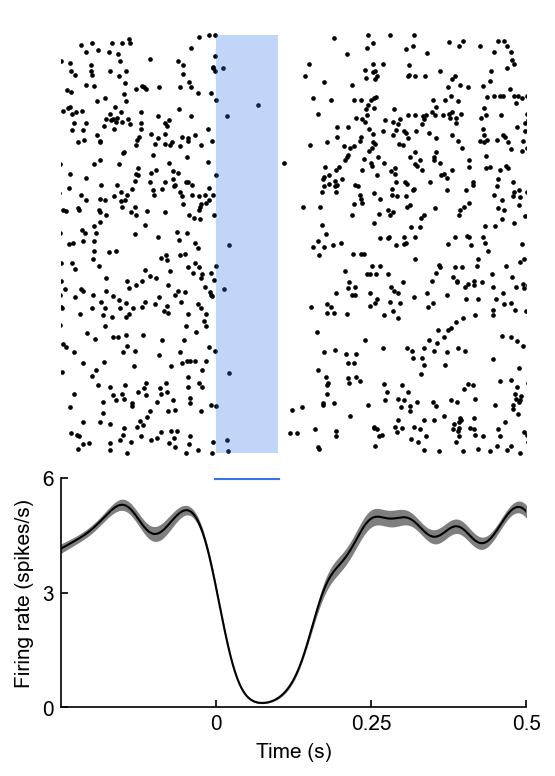

In [309]:
visualizeClusterInternal3(sessionfile0,50, S0_laseron)

C:\Users\insan\AppData\Local\Temp\ipykernel_10032\2681257804.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


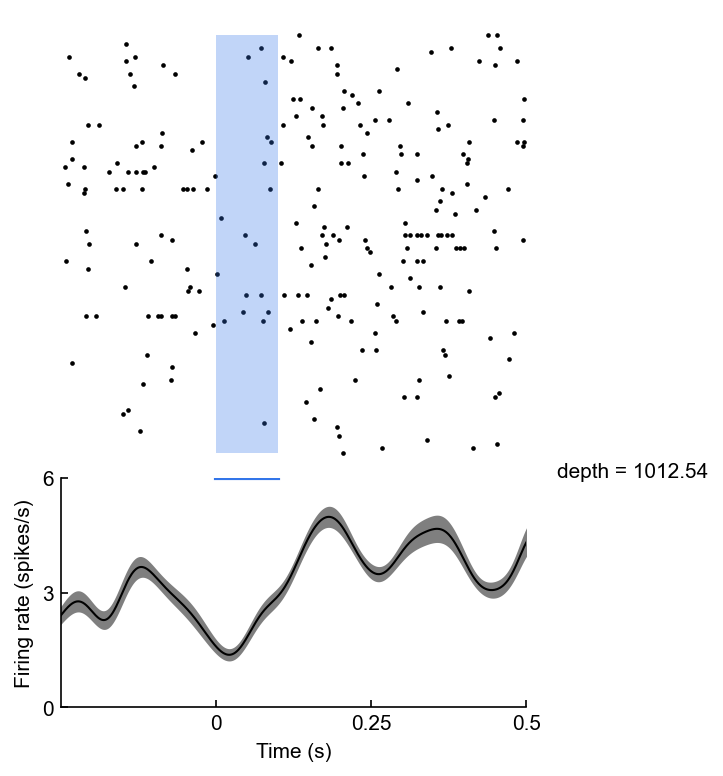

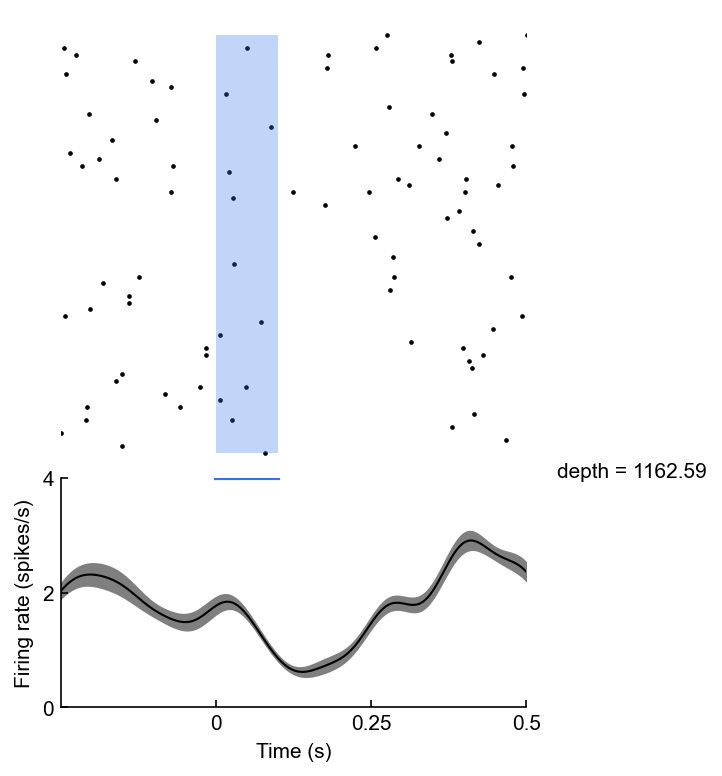

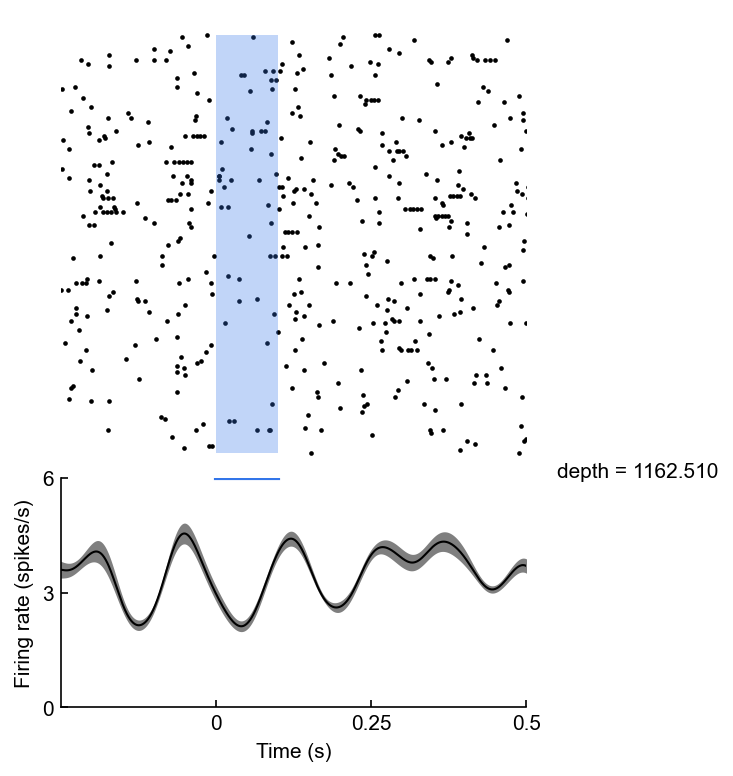

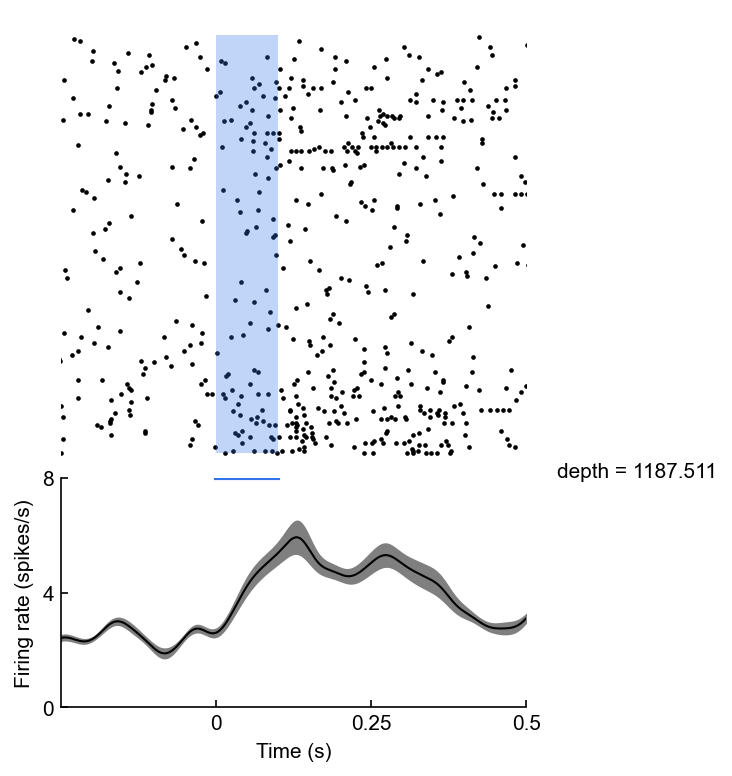

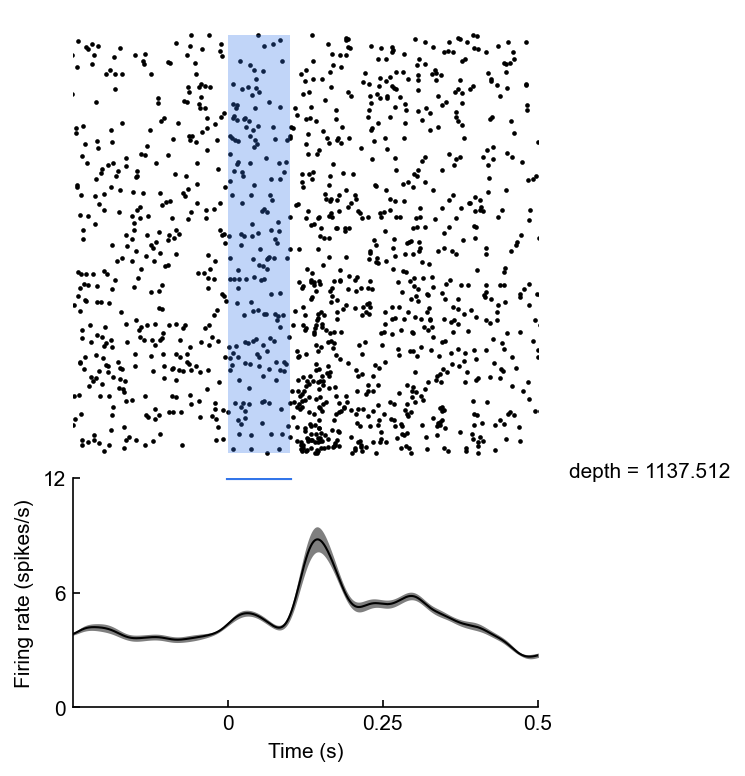

...

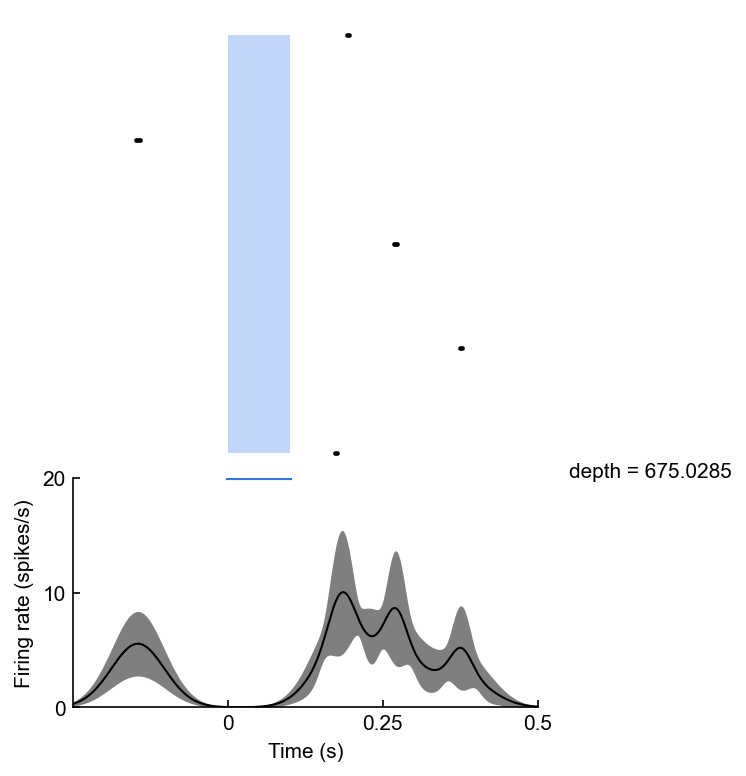

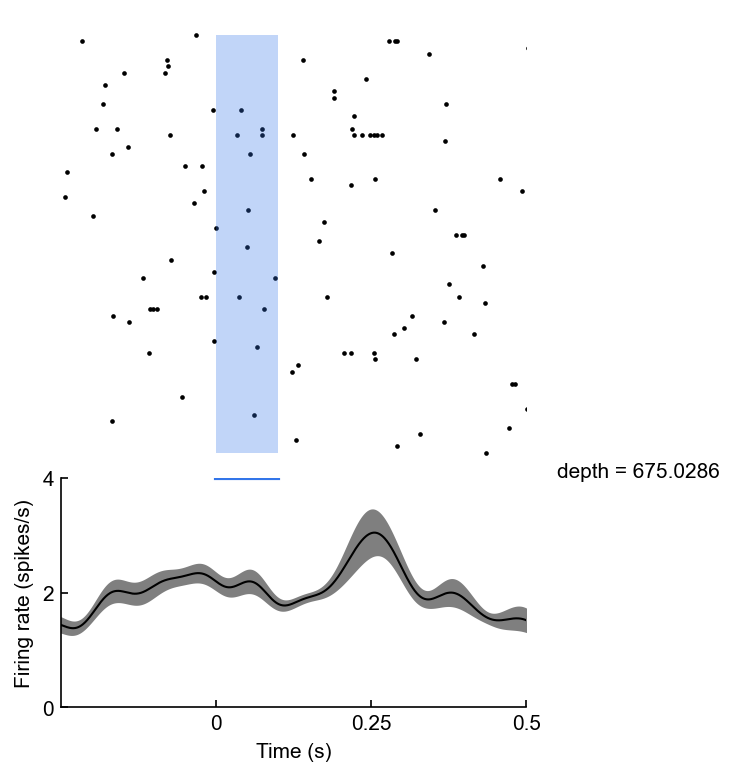

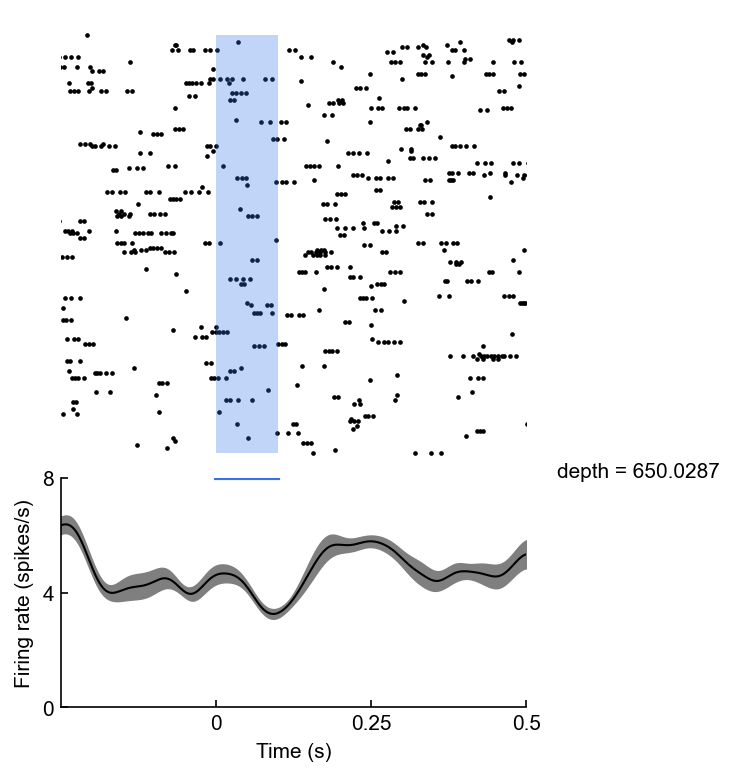

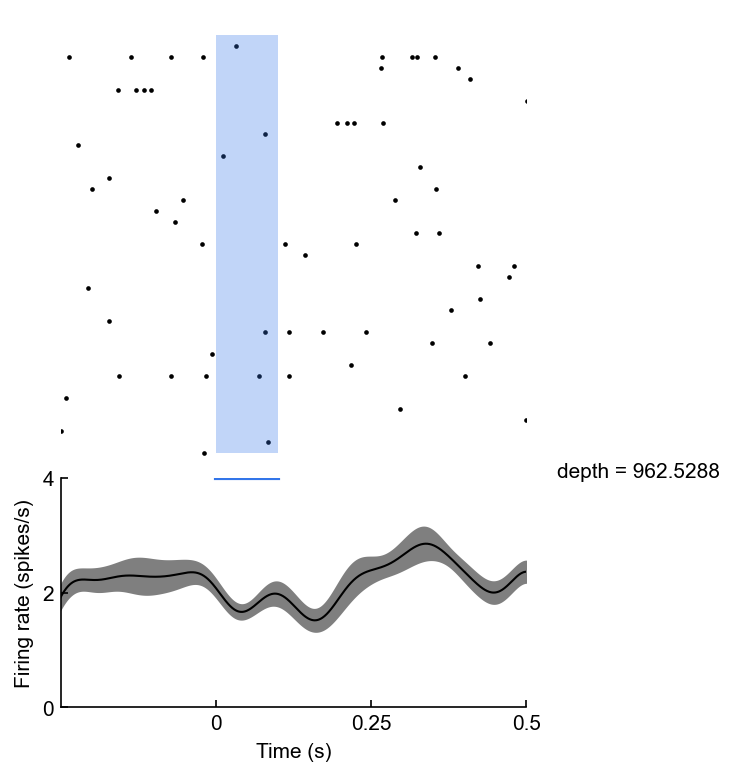

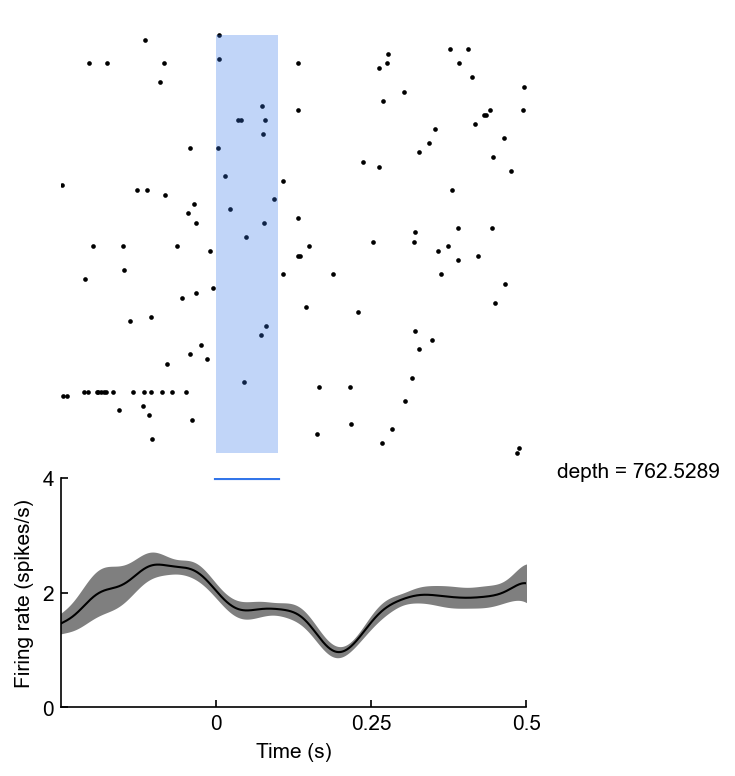

In [60]:
for clust in sessionfile0_goodcells:
    visualizeClusterInternal3(sessionfile0,clust, S0_laseron)

C:\Users\insan\AppData\Local\Temp\ipykernel_10032\1853216618.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


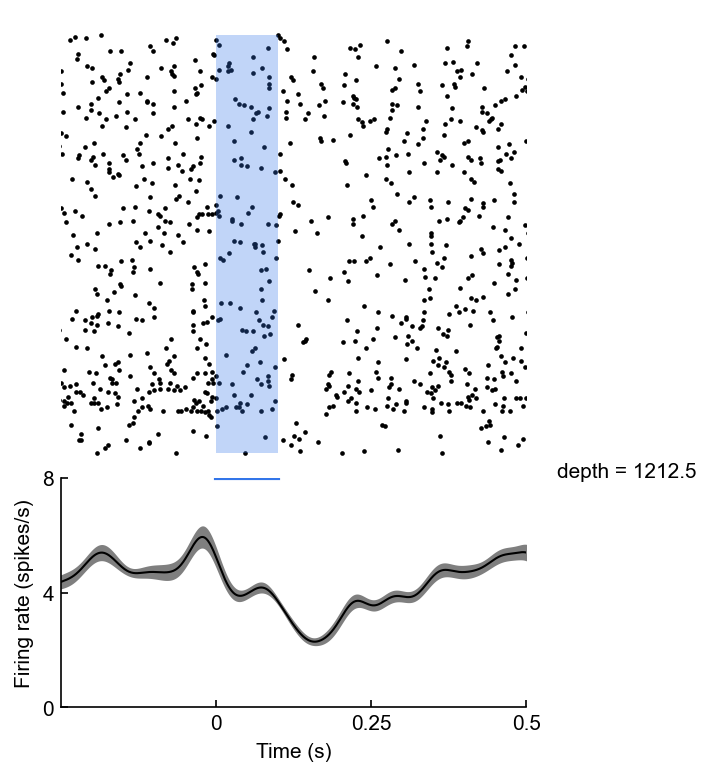

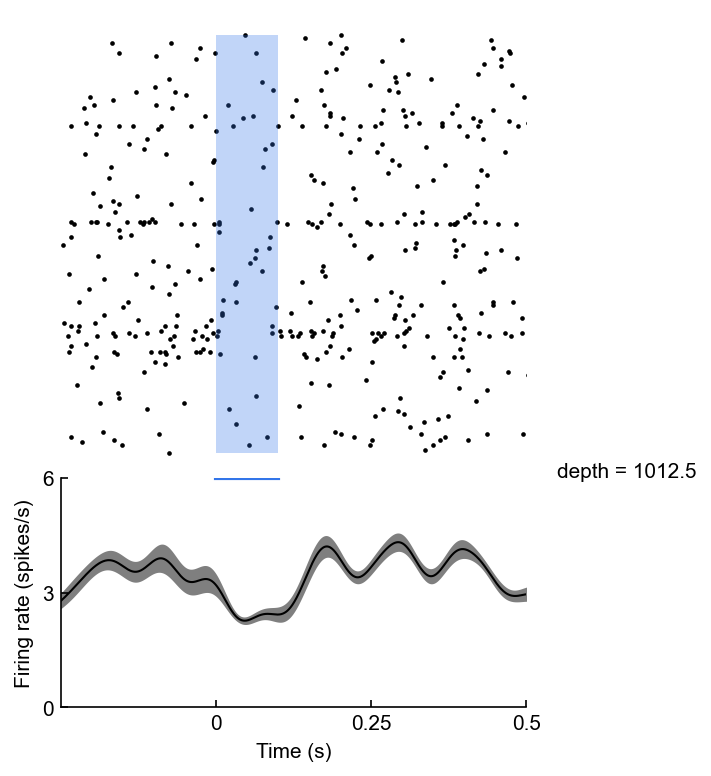

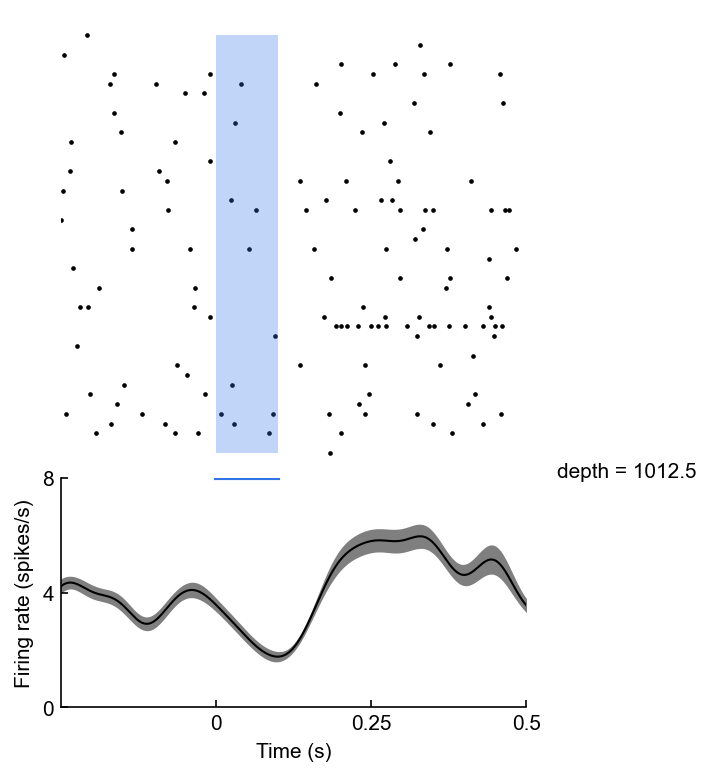

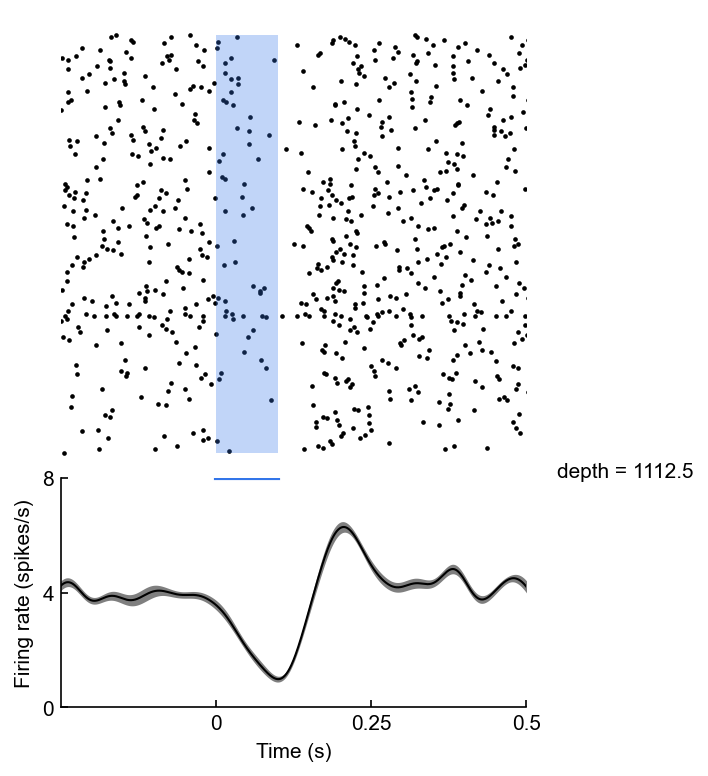

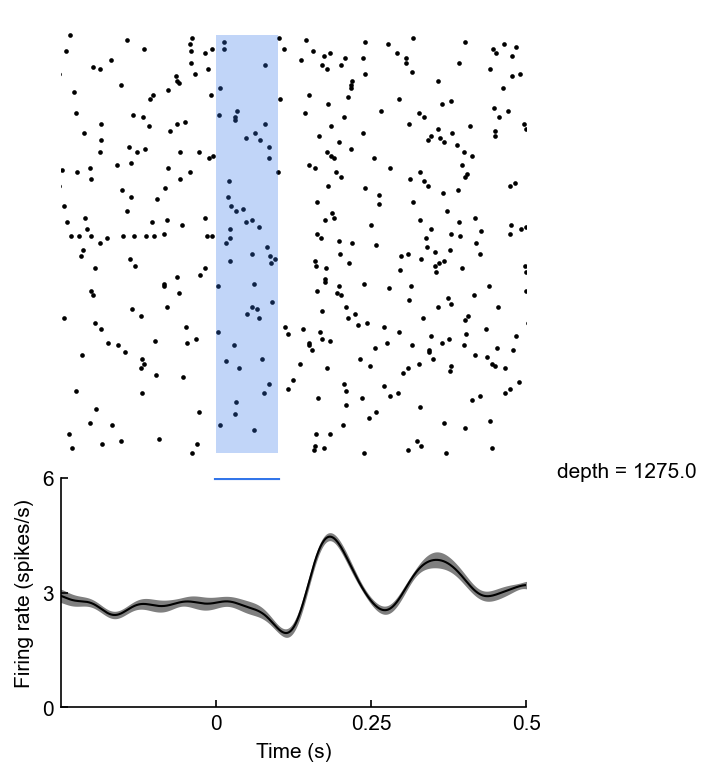

...

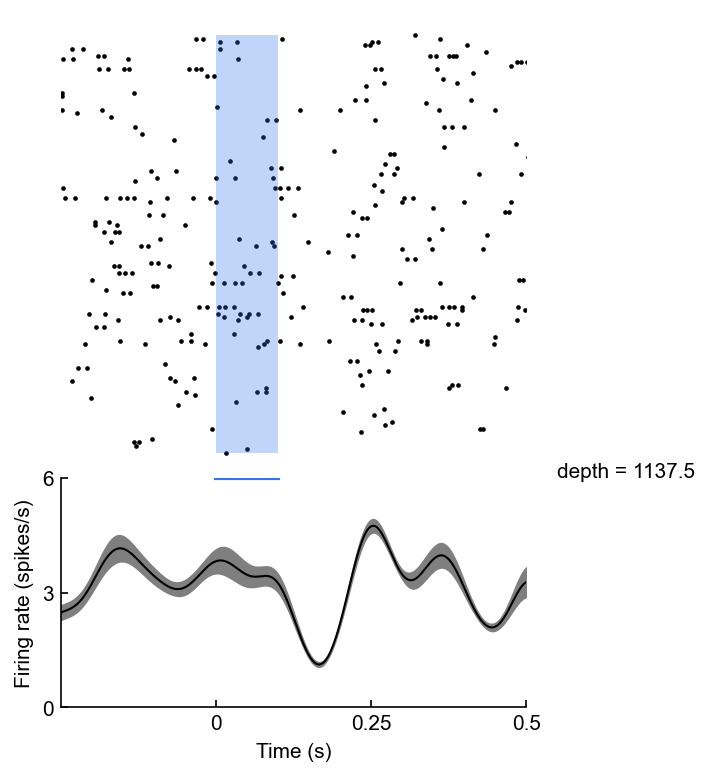

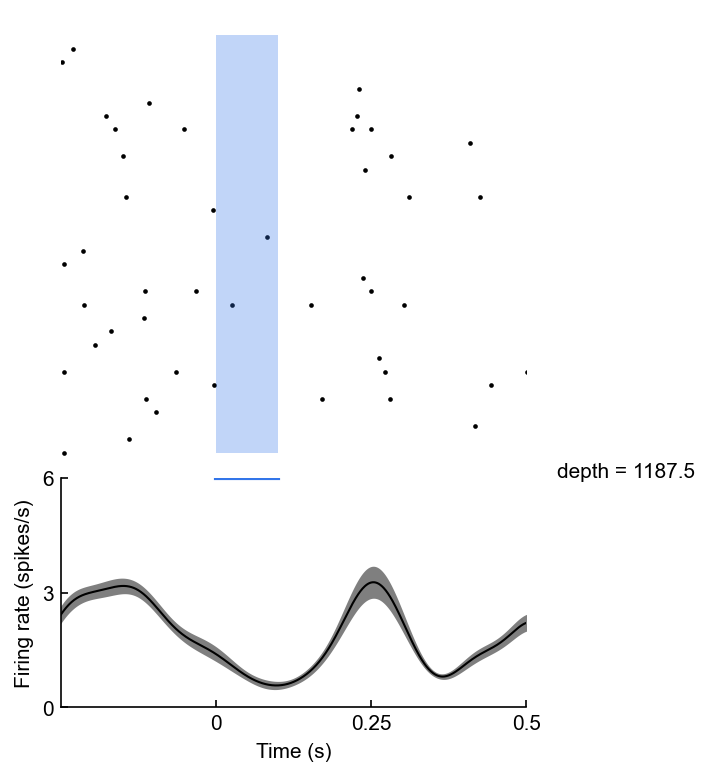

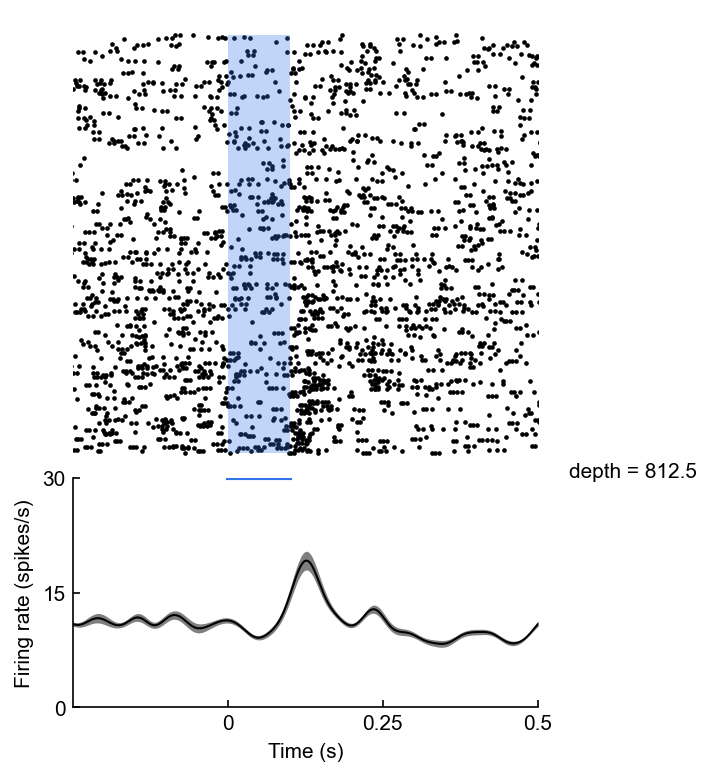

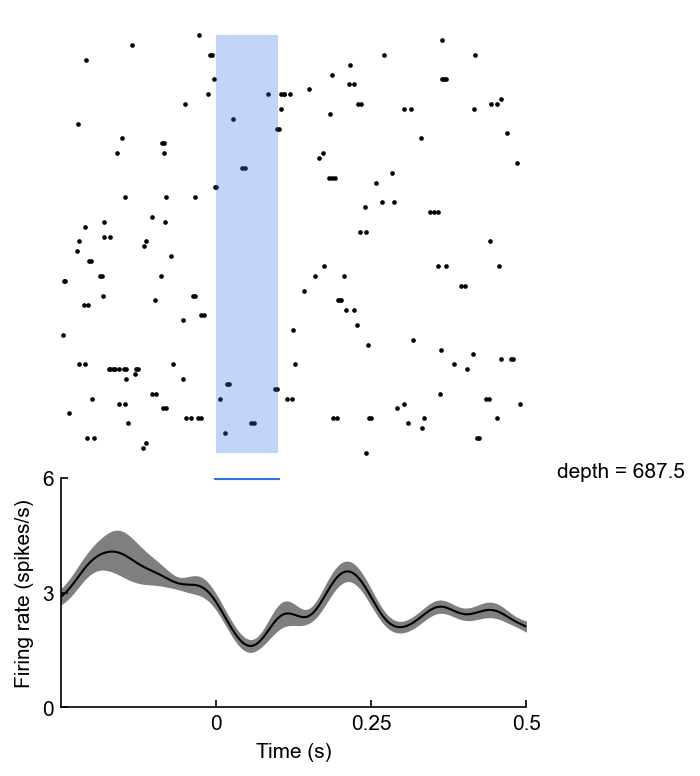

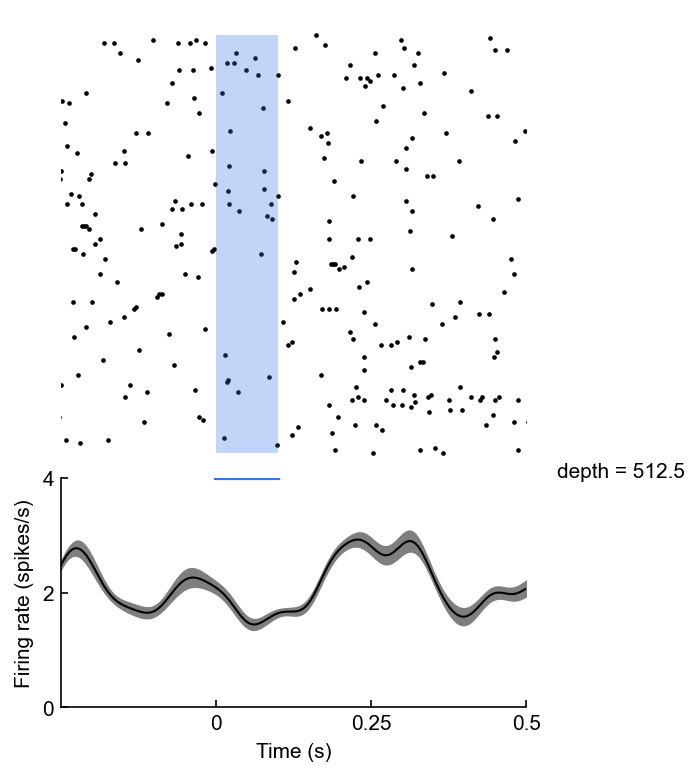

In [56]:
for clust in sessionfile1_goodcells:
    visualizeClusterInternal3(sessionfile1,clust, S1_laseron)

C:\Users\insan\AppData\Local\Temp\ipykernel_10032\472496089.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(4,6))


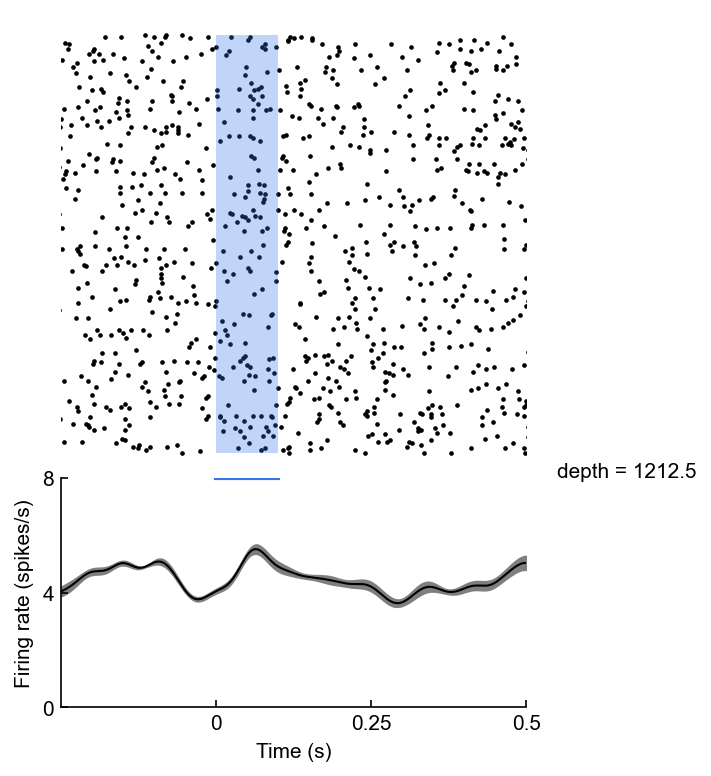

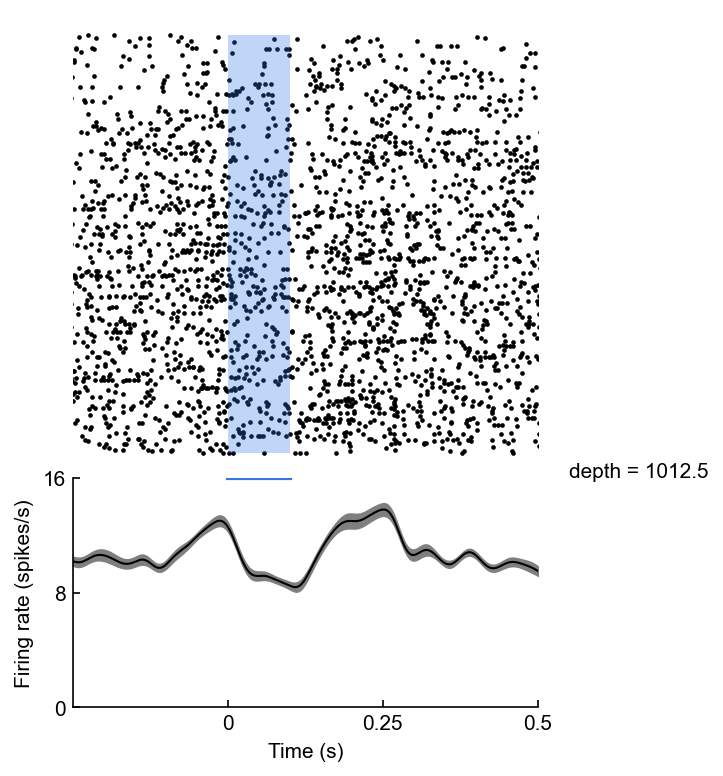

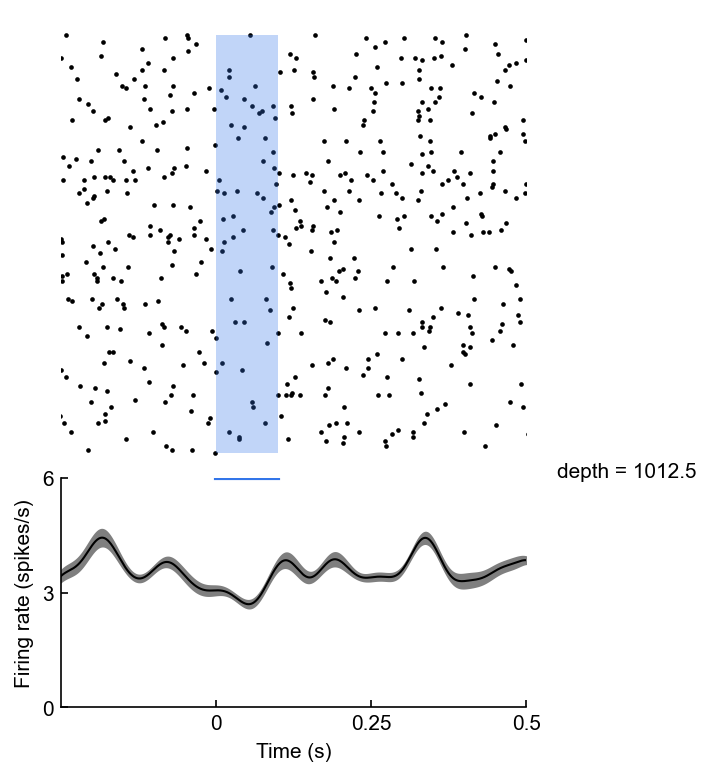

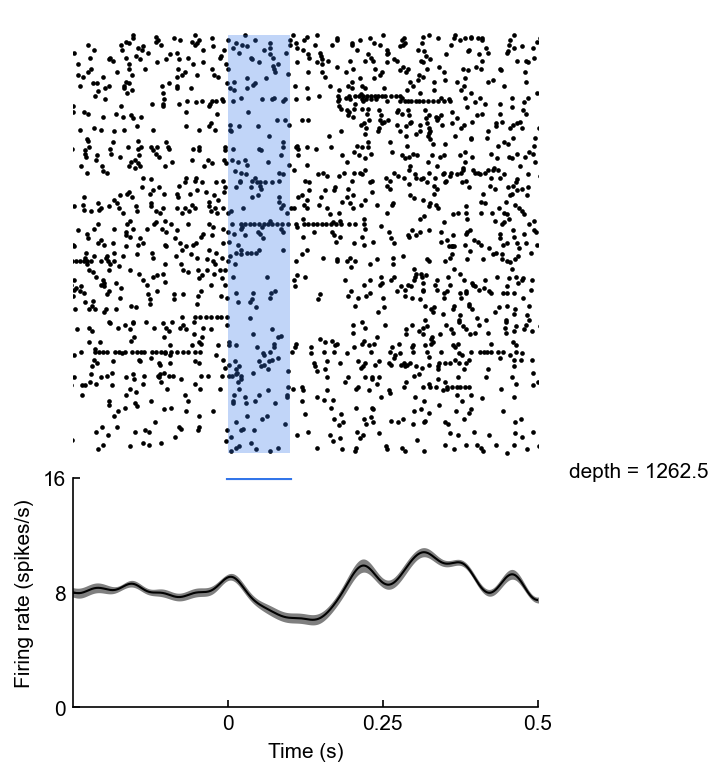

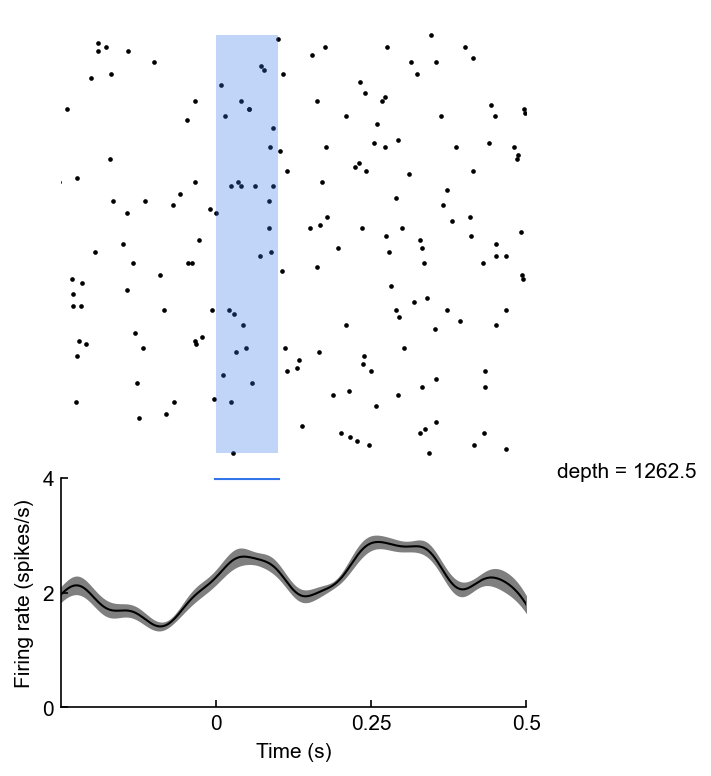

...

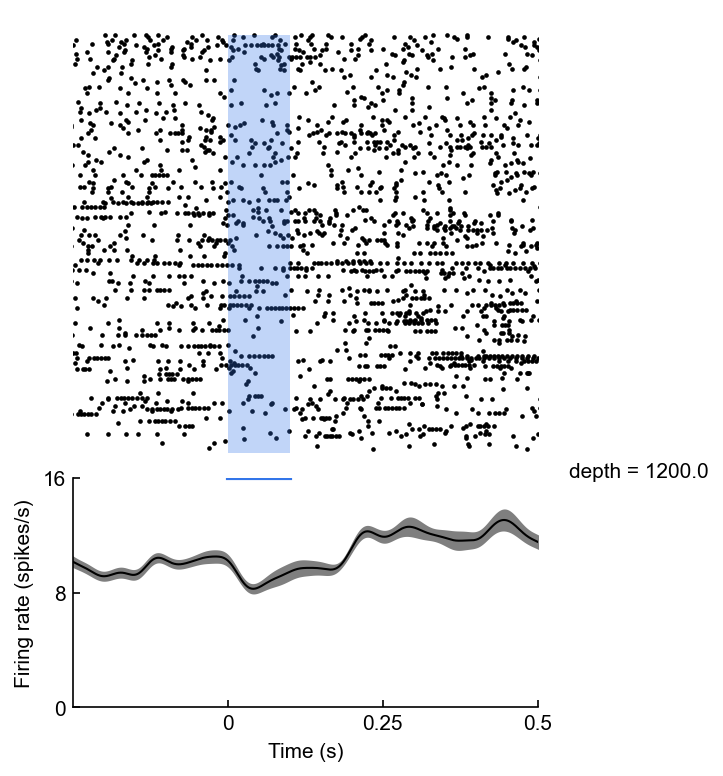

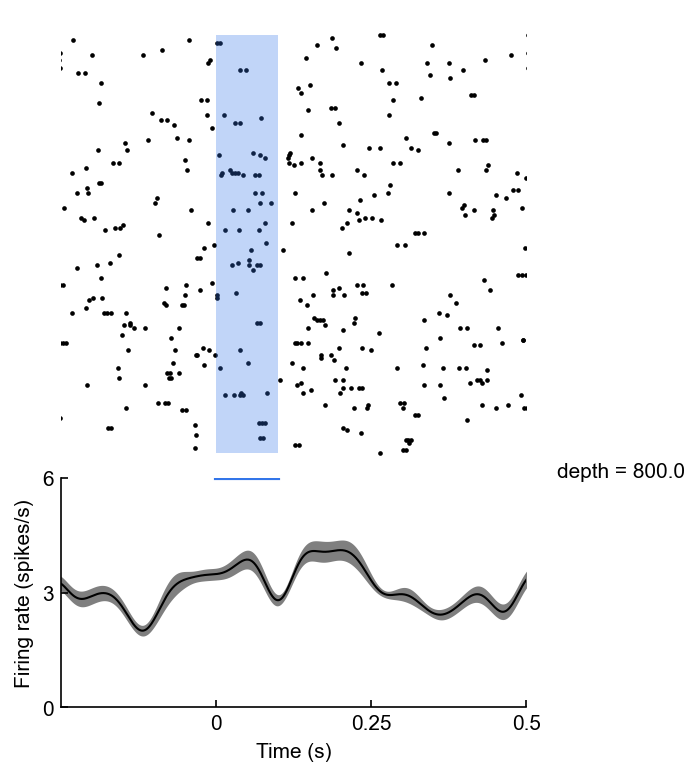

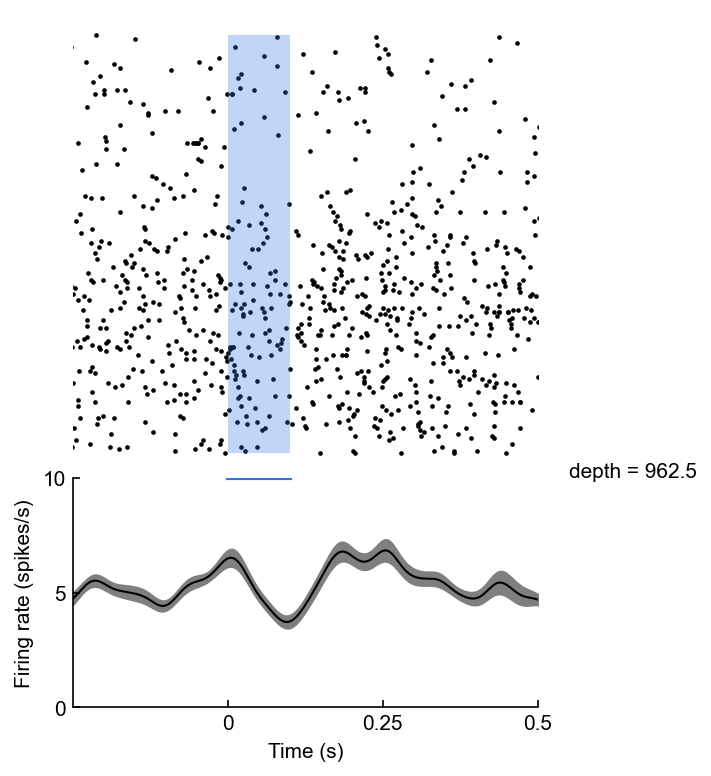

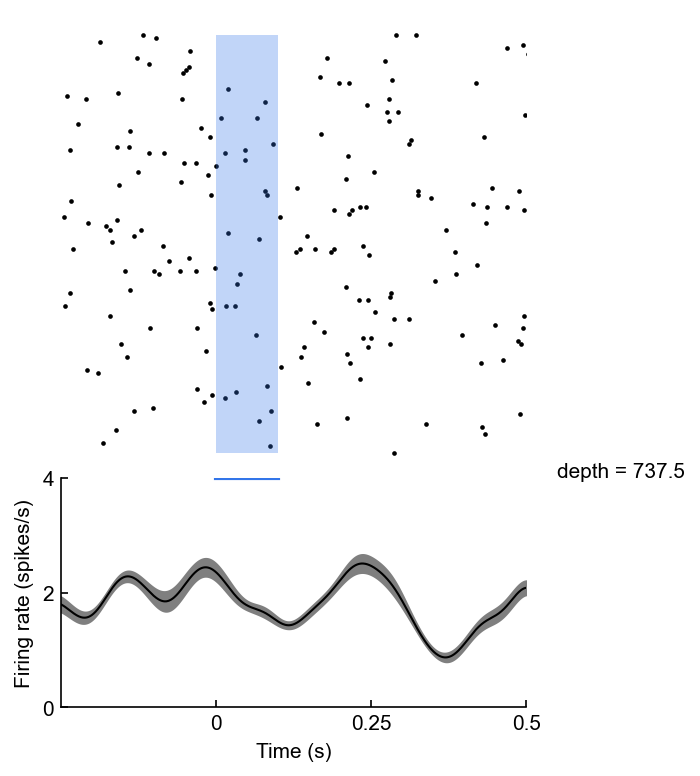

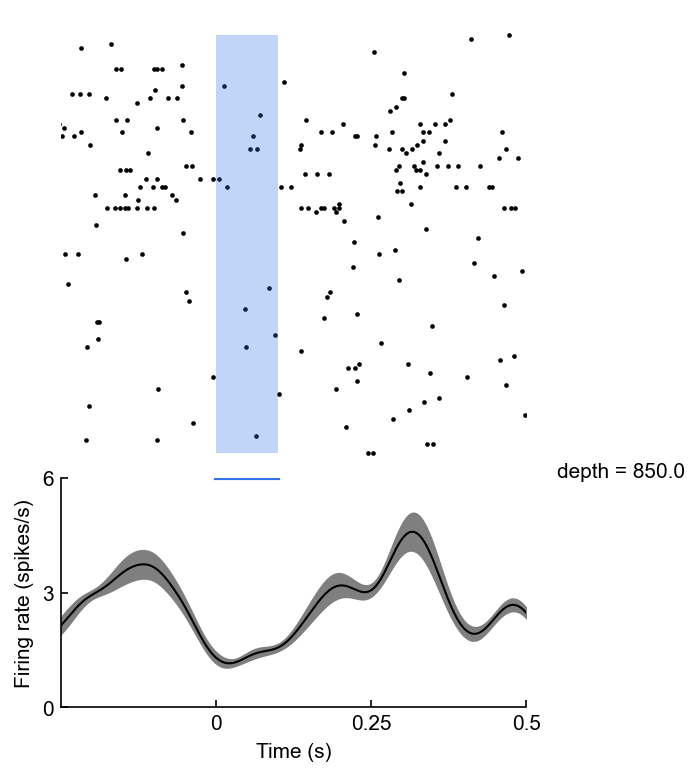

In [58]:
for clust in sessionfile2_goodcells:
    visualizeClusterInternal3(sessionfile2,clust, S2_laseron)

In [31]:
S0_cell = [50,63,93,109,121,192,198,214]
#S0_cell = np.array(S0_cell)

In [32]:
S1_cell = [6,13,65,98,104,105,170,200,225,237,246,312,361]

In [33]:
S2_cell = [68,90,108,114,193,204,205]

In [34]:
for cell in S0_cell:
    print(sessionfile0.clusters.depth[cell])

525.0
575.0
687.5
1037.5
1062.5
1137.5
1212.5
825.0


In [35]:
for cell in S1_cell:
    print(sessionfile1.clusters.depth[cell])

1012.5
1112.5
525.0
600.0
725.0
725.0
862.5
537.5
637.5
1212.5
1112.5
612.5
750.0


In [36]:
for cell in S2_cell:
    print(sessionfile2.clusters.depth[cell])

625.0
1050.0
912.5
887.5
1025.0
837.5
837.5


In [37]:
len(sessionfile0.clusters.depth)

267

In [265]:
sessionfile0.clusters.depth

{0: 1212.5,
 1: 1012.5,
 2: 1012.5,
 3: 1012.5,
 4: 1012.5,
 5: 1150.0,
 6: 1150.0,
 7: 1125.0,
 8: 1250.0,
 9: 1162.5,
 10: 1162.5,
 11: 1187.5,
 12: 1137.5,
 13: 1137.5,
 14: 1112.5,
 15: 1275.0,
 16: 1125.0,
 17: 1125.0,
 18: 1287.5,
 19: 1287.5,
 20: 1287.5,
 22: 1112.5,
 23: 1125.0,
 24: 1300.0,
 25: 1300.0,
 26: 1300.0,
 27: 1225.0,
 28: 1200.0,
 29: 1200.0,
 30: 1237.5,
 31: 1237.5,
 32: 775.0,
 33: 775.0,
 34: 675.0,
 35: 675.0,
 37: 750.0,
 38: 700.0,
 39: 812.5,
 40: 700.0,
 41: 700.0,
 42: 525.0,
 43: 525.0,
 45: 887.5,
 46: 900.0,
 47: 900.0,
 48: 900.0,
 49: 550.0,
 50: 525.0,
 51: 550.0,
 52: 550.0,
 53: 550.0,
 54: 550.0,
 55: 587.5,
 56: 600.0,
 57: 875.0,
 58: 875.0,
 59: 875.0,
 60: 875.0,
 61: 575.0,
 62: 537.5,
 63: 575.0,
 64: 850.0,
 65: 850.0,
 66: 850.0,
 67: 875.0,
 68: 850.0,
 69: 825.0,
 70: 800.0,
 71: 800.0,
 72: 800.0,
 73: 800.0,
 74: 787.5,
 75: 800.0,
 76: 600.0,
 77: 625.0,
 79: 625.0,
 86: 825.0,
 87: 825.0,
 89: 825.0,
 90: 650.0,
 91: 725.0,
 92: 72

In [47]:
len(S0_cell)

8

In [48]:
len(sessionfile0_goodcells)

58

In [49]:
len(S1_cell)

13

In [50]:
len(sessionfile1_goodcells)

84

In [46]:
len(S2_cell)

7

In [51]:
len(sessionfile2_goodcells)

86

meta NOT subset; don't know how to subset; dropped


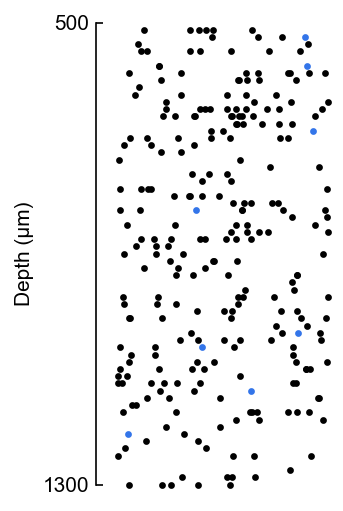

In [40]:
fig, ax = plt.subplots(figsize=(2,4))


for cell,depth in sessionfile0.clusters.depth.items():
    if cell in S0_cell:
        ax.scatter(np.random.uniform(0,5),depth,color=LASER_COLOR,s=5,clip_on = False)
    else:
        ax.scatter(np.random.uniform(0,5),depth,color='black',s=5,clip_on = False)
        
ax.set_ylim([1300,500])
ax.set_yticks([1300,500])
ax.set_yticklabels(['1300','500'])  
ax.set_ylabel('Depth (µm)')

ax.set_xlim([-0.5,5])
ax.set_xticks([-0.5,5])

ax.get_xaxis().set_visible(False)
ax.spines['bottom'].set_visible(False)
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\AE_302_short\\S0.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')

meta NOT subset; don't know how to subset; dropped


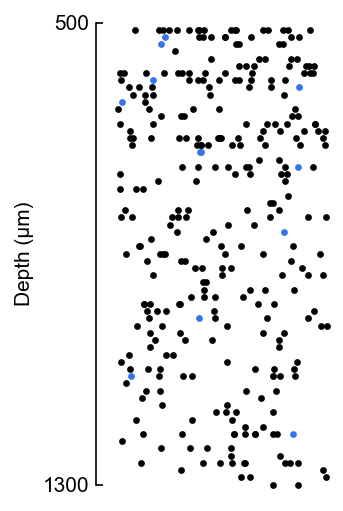

In [41]:
fig, ax = plt.subplots(figsize=(2,4))


for cell,depth in sessionfile1.clusters.depth.items():
    if cell in S1_cell:
        ax.scatter(np.random.uniform(0,5),depth,color=LASER_COLOR,s=5,clip_on = False)
    else:
        ax.scatter(np.random.uniform(0,5),depth,color='black',s=5,clip_on = False)
        
ax.set_ylim([1300,500])
ax.set_yticks([1300,500])
ax.set_yticklabels(['1300','500'])  
ax.set_ylabel('Depth (µm)')

ax.set_xlim([-0.5,5])
ax.set_xticks([-0.5,5])


ax.get_xaxis().set_visible(False)
ax.spines['bottom'].set_visible(False)
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\AE_302_short\\S1.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')

meta NOT subset; don't know how to subset; dropped


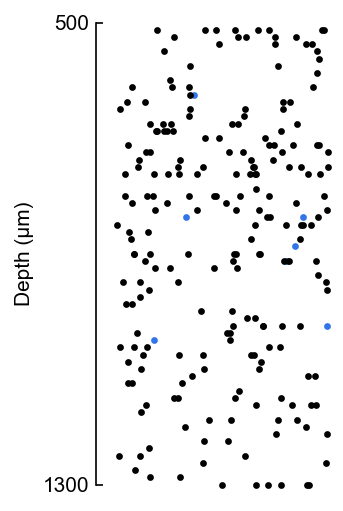

In [42]:
fig, ax = plt.subplots(figsize=(2,4))


for cell,depth in sessionfile2.clusters.depth.items():
    if cell in S2_cell:
        ax.scatter(np.random.uniform(0,5),depth,color=LASER_COLOR,s=5,clip_on = False)
    else:
        ax.scatter(np.random.uniform(0,5),depth,color='black',s=5,clip_on = False)
        
ax.set_ylim([1300,500])
ax.set_yticks([1300,500])
ax.set_yticklabels(['1300','500'])  
ax.set_ylabel('Depth (µm)')

ax.set_xlim([-0.5,5])
ax.set_xticks([-0.5,5])


ax.get_xaxis().set_visible(False)
ax.spines['bottom'].set_visible(False)
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\AE_302_short\\S2.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')

meta NOT subset; don't know how to subset; dropped


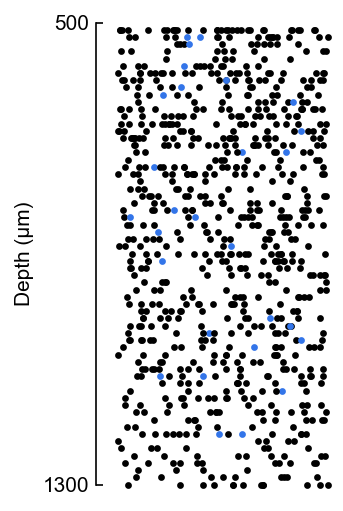

In [43]:
fig, ax = plt.subplots(figsize=(2,4))


for cell,depth in sessionfile0.clusters.depth.items():
    if cell in S0_cell:
        ax.scatter(np.random.uniform(0,5),depth,color=LASER_COLOR,s=5,clip_on = False)
    else:
        ax.scatter(np.random.uniform(0,5),depth,color='black',s=5,clip_on = False)
for cell,depth in sessionfile1.clusters.depth.items():
    if cell in S1_cell:
        ax.scatter(np.random.uniform(0,5),depth,color=LASER_COLOR,s=5,clip_on = False)
    else:
        ax.scatter(np.random.uniform(0,5),depth,color='black',s=5,clip_on = False)
for cell,depth in sessionfile2.clusters.depth.items():
    if cell in S2_cell:
        ax.scatter(np.random.uniform(0,5),depth,color=LASER_COLOR,s=5,clip_on = False)
    else:
        ax.scatter(np.random.uniform(0,5),depth,color='black',s=5,clip_on = False)
        
        
ax.set_ylim([1300,500])
ax.set_yticks([1300,500])
ax.set_yticklabels(['1300','500'])  
ax.set_ylabel('Depth (µm)')

ax.set_xlim([-0.5,5])
ax.set_xticks([-0.5,5])


ax.get_xaxis().set_visible(False)
ax.spines['bottom'].set_visible(False)
fig.savefig(os.path.join('C:\\Users\insan\\Desktop\\AE_302_short\\depth summary.pdf'),transparent=False,facecolor="white", bbox_inches = 'tight')

In [268]:
len(S0_cell)

8

In [269]:
len(S1_cell)

13

In [270]:
len(S2_cell)

8

In [276]:
np.random.uniform(0,5)

2.7649863790563205